# Single Particle performance plots


   * [GEN Level plots](#Gen-level)
   * [All clusters without selection](#All-clusters-without-selection)
      * [2D clusters per layer](#2D-clusters-per-layer)
      * [2D cluster energy](#2D-cluster-energy)
      * [2D cluster: # of TriggerCells](#2D-cluster:-#-of-TriggerCells)
      * [# of 3D clusters](##-of-3D-clusters)
   * [Cluster matched to GEN particles](#Cluster-matched-to-GEN-particles)
      * [2D clusters per layer](#2D-clusters-per-layer)
      * [2D clusters: # of Trigger Cells](#2D-clusters:-#-of-Trigger-Cells)
      * [2D Cluster Energy](#2D-Cluster-Energy)
      * [3D clusters: # of 2D components](#3D-clusters:-#-of-2D-components)
      * [3D cluster energy](#3D-cluster-energy)
   * [Resolution studies](#Resolution-Studies)



In [33]:
import sys
sys.path.insert(0, '..')
import ROOT
import root_numpy as rnp
import l1THistos as histos
import math
import uuid

ROOT.enableJSVis()

from drawingTools import *

normalized_histos = list()
    

In [34]:

version = 'v15'
particle = 'pion'


samples = []


sample_hadronGun_PU0 = Sample('hadronGun_PU0', 'PU0', version)
sample_hadronGun_PU200 = Sample('hadronGun_PU200', 'PU200', version)


samples_hadrons = [sample_hadronGun_PU0, sample_hadronGun_PU200]




sample_gPt35_PU0 = Sample('photonPt35_PU0', 'Pt35 PU0', version)
sample_gPt35_PU200 = Sample('photonPt35_PU200', 'Pt35 PU200', version)
# sample_gPt50_PU0 = Sample('photonPt50_PU0', 'Pt50 PU0', version)
# sample_gPt50_PU200 = Sample('photonPt50_PU200', 'Pt50 PU200', version)

samples_pt35 = [sample_gPt35_PU0, sample_gPt35_PU200]
labels_pt35 = ['pt35 PU0', 'pt35 PU200']
# sample_gPt50_PU0
# samples_pt50 = [sample_gPt50_PU0, sample_gPt50_PU200]
# labels_pt50 = ['pt50 PU0', 'pt50 PU200']

# here we steer which one need to be done
if particle == 'pion':
    samples = samples_hadrons
elif particle == 'photon':
    samples = samples_pt35

#samples = samples_pt35
algos = ['DEF', 'DBS']
particles = ['all', 'photon']

#particle = 'pion'
#particle = 'photon'


In [35]:
def getHistograms(name, samples):
    return [histos.GenParticleHistos(name, sample.histo_file) for sample in samples]

## Gen level plots

In [36]:
# for normalization

hGen_histos = [histos.GenParticleHistos('h_genParts_{}'.format(particle), sample.histo_file) for sample in samples]


['h_genParts_pion_energy', 'h_genParts_pion_eta', 'h_genParts_pion_pt', 'h_genParts_pion_reachedEE']
['h_genParts_pion_energy', 'h_genParts_pion_eta', 'h_genParts_pion_pt', 'h_genParts_pion_reachedEE']


In [37]:
labels = [sample.label for sample in samples]

hGen_energy = [histo.h_energy for histo in hGen_histos]
drawSame(hGen_energy, labels,'hist',logy=True, norm=True)



In [38]:
hGen_eta = [histo.h_eta for histo in hGen_histos]
drawSame(hGen_eta, labels,'hist',logy=True)



In [39]:

hGen_pt = [histo.h_pt for histo in hGen_histos]
drawSame(hGen_pt, labels,'hist',logy=True, norm=True)


In [40]:
hGen_reachedEE = [histo.h_reachedEE for histo in hGen_histos]
drawSame(hGen_reachedEE, labels,'hist',logy=True)



In [41]:
# Extract # of events for normalization
nevents_ee = [histo.GetBinContent(3) for histo in hGen_reachedEE]
print nevents_ee


[32584.0, 791.0]


In [42]:
def normalize(histos, factors):
    global normalized_histos
    for idx in range(0, len(histos)):
        print histos[idx]
        if histos[idx] not in normalized_histos:
            histos[idx].Scale(1./factors[idx])
            normalized_histos.append(histos[idx])

In [43]:
import pandas as pd
import numpy as np
class HistoSetRetriever():
    def __init__(self, Histoset, algos, particle, samples, normalization=None):
        # this defines a data frame with 1 ROW per ALGO and 1 COLUMN per plot type (class)
        # each element is an array of plots, one per sample
        # additional columns:
        # labels: array of label per sample
        # normalization: array of normalization values per sample
        hsets = {}
        h_methods = []
        for algo in algos:
            hsets[algo] = [Histoset('{}_{}'.format(algo, particle), sample.histo_file) for sample in samples]
            h_methods = [method for method in dir(hsets[algo][0]) if method.startswith('h')]
        #print h_methods
        #pd.DataFrame.__init__(self, index=algos, columns=h_methods)
        self.histos = pd.DataFrame(index=algos, columns=h_methods)
        #print self.histos
        lebelslist = pd.Series(index=algos)
        for algo in algos:
            for method in h_methods:
                self.histos.loc[algo][method] = [getattr(haset, method) for haset in hsets[algo]]
            lebelslist.loc[algo] = ['{} {}'.format(algo, sample.label) for sample in samples]
        self.histos.loc[:, 'labels'] = lebelslist
        if normalization is not None:
            normlist = pd.Series(index=algos, dtype='O')
            for algo in algos:
                 normlist.loc[algo] = normalization
            self.histos.loc[:, 'norm'] = normlist
                
histosAlgos_all = HistoSetRetriever(histos.HistoSetClusters, algos, 'all', samples, normalization=nevents_ee).histos

#print histosAlgos_all

histosAlgos_all

#histoset['DEF'].hcl2d = []
        
# algo = 'DEF'
# particle = 'all'
# hsetClusters = [histos.HistoSetClusters('{}_{}'.format(algo, particle), sample.histo_file) for sample in samples]
# labels = ['{} {} {}'.format(algo, particle, sample.label) for sample in samples]
# print dir(hsetClusters[0])

['h_tc_DEF_all_absz', 'h_tc_DEF_all_energy', 'h_tc_DEF_all_energyPetaVphi', 'h_tc_DEF_all_energyVeta', 'h_tc_DEF_all_energyVetaL11t20', 'h_tc_DEF_all_energyVetaL1t5', 'h_tc_DEF_all_energyVetaL21t60', 'h_tc_DEF_all_energyVetaL6t10', 'h_tc_DEF_all_layer', 'h_tc_DEF_all_layerVenergy', 'h_tc_DEF_all_subdet', 'h_tc_DEF_all_wafertype']
['h_cl2d_DEF_all_energy', 'h_cl2d_DEF_all_layer', 'h_cl2d_DEF_all_layerVenergy', 'h_cl2d_DEF_all_layerVnCoreCells', 'h_cl2d_DEF_all_layerVncells', 'h_cl2d_DEF_all_nCoreCells', 'h_cl2d_DEF_all_ncells']
['h_cl3d_DEF_all_eMaxOverE', 'h_cl3d_DEF_all_energy', 'h_cl3d_DEF_all_firstlayer', 'h_cl3d_DEF_all_nclu', 'h_cl3d_DEF_all_ncluVpt', 'h_cl3d_DEF_all_npt05', 'h_cl3d_DEF_all_npt20', 'h_cl3d_DEF_all_pt', 'h_cl3d_DEF_all_sEtaEtaMax', 'h_cl3d_DEF_all_sEtaEtaTot', 'h_cl3d_DEF_all_sPhiPhiMax', 'h_cl3d_DEF_all_sPhiPhiTot', 'h_cl3d_DEF_all_sZZ', 'h_cl3d_DEF_all_showlenght']
['h_tc_DEF_all_absz', 'h_tc_DEF_all_energy', 'h_tc_DEF_all_energyPetaVphi', 'h_tc_DEF_all_energyVet

,hcl2d,hcl3d,htc,labels,norm
DEF,[<l1THistos.ClusterHistos instance at 0x11b1a6...,[<l1THistos.Cluster3DHistos instance at 0x11b1...,"[<l1THistos.TCHistos instance at 0x11b194050>,...","[DEF PU0, DEF PU200]","[32584.0, 791.0]"
DBS,[<l1THistos.ClusterHistos instance at 0x11b1a6...,[<l1THistos.Cluster3DHistos instance at 0x11b1...,"[<l1THistos.TCHistos instance at 0x11b1a6c68>,...","[DBS PU0, DBS PU200]","[32584.0, 791.0]"


## All clusters without selection
### 2D clusters per layer


In [44]:
# algo = "DEF"
# histosAlgos_all
#algo = 'DEF'
for algo in algos:
    hByAlgo_layer = [histo.h_layer for histo in histosAlgos_all.loc[algo].hcl2d]
    normalize(hByAlgo_layer, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo_layer, histosAlgos_all.loc[algo]['labels'], 'hist',logy=True)


<ROOT.TH1F object ("h_cl2d_DEF_all_layer") at 0x7fe06b19c090>
<ROOT.TH1F object ("h_cl2d_DEF_all_layer") at 0x7fe06b19de90>
<ROOT.TH1F object ("h_cl2d_DBS_all_layer") at 0x7fe06a7cf7c0>
<ROOT.TH1F object ("h_cl2d_DBS_all_layer") at 0x7fe06a6f0310>


In [45]:


for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample_layer = [histo.h_layer for histo in  histosAlgos_all['hcl2d'].apply(lambda x: x[s_id])]
    drawSame(hBySample_layer, labels_bySample,'hist',logy=True)

### 2D cluster energy

In [46]:
for algo in algos:
    hByAlgo = [histo.h_energy for histo in histosAlgos_all.loc[algo].hcl2d]
    normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'hist',logy=True)


<ROOT.TH1F object ("h_cl2d_DEF_all_energy") at 0x7fe06a55aa90>
<ROOT.TH1F object ("h_cl2d_DEF_all_energy") at 0x7fe06b19cb70>
<ROOT.TH1F object ("h_cl2d_DBS_all_energy") at 0x7fe06a7cee70>
<ROOT.TH1F object ("h_cl2d_DBS_all_energy") at 0x7fe06a6f0700>


In [47]:
for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample = [histo.h_energy for histo in  histosAlgos_all['hcl2d'].apply(lambda x: x[s_id])]
    drawSame(hBySample, labels_bySample,'hist',logy=True)

### 2D cluster: # of TriggerCells 


In [48]:
for algo in algos:
    hByAlgo = [histo.h_ncells for histo in histosAlgos_all.loc[algo].hcl2d]
    normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'hist',logy=True)


<ROOT.TH1F object ("h_cl2d_DEF_all_ncells") at 0x7fe06b19c780>
<ROOT.TH1F object ("h_cl2d_DEF_all_ncells") at 0x7fe06a7d5e70>
<ROOT.TH1F object ("h_cl2d_DBS_all_ncells") at 0x7fe06a3e2d60>
<ROOT.TH1F object ("h_cl2d_DBS_all_ncells") at 0x7fe06a7c9320>


In [49]:
for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample = [histo.h_ncells for histo in  histosAlgos_all['hcl2d'].apply(lambda x: x[s_id])]
    drawSame(hBySample, labels_bySample,'hist',logy=True)

### # of 3D clusters

In [50]:
for algo in algos:
    hByAlgo = [histo.h_npt05 for histo in histosAlgos_all.loc[algo].hcl3d]
    #normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'hist',logy=True)


These plots are to be compared with:

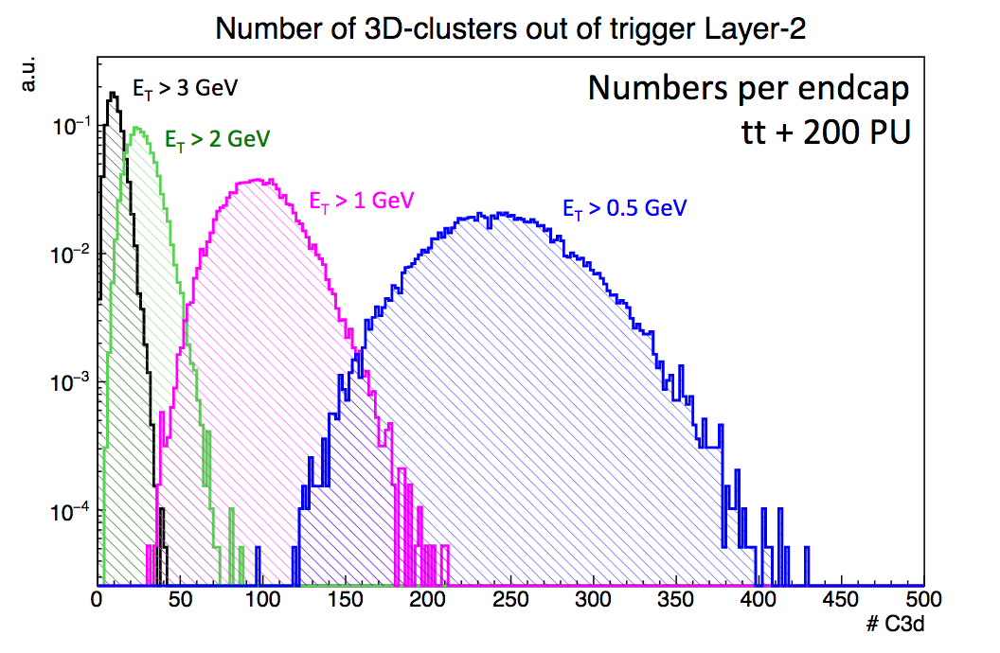

FIXME: what is the selection applied for this one?

In [51]:
for algo in algos:
    hByAlgo = [histo.h_npt20 for histo in histosAlgos_all.loc[algo].hcl3d]
    #normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'hist',logy=True)

In [52]:
for algo in algos:
    hByAlgo = [histo.h_pt for histo in histosAlgos_all.loc[algo].hcl3d]
    normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'hist',logy=True)


<ROOT.TH1F object ("h_cl3d_DEF_all_pt") at 0x7fe06a7d4ac0>
<ROOT.TH1F object ("h_cl3d_DEF_all_pt") at 0x7fe06a7d8320>
<ROOT.TH1F object ("h_cl3d_DBS_all_pt") at 0x7fe06b23b630>
<ROOT.TH1F object ("h_cl3d_DBS_all_pt") at 0x7fe06a6f47b0>


In [53]:
for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample = [histo.h_pt for histo in  histosAlgos_all['hcl3d'].apply(lambda x: x[s_id])]
    drawSame(hBySample, labels_bySample,'hist',logy=True)

## Cluster matched to GEN particles

We look at cluters matched with GEN particle with 1.7 < |eta| 2.8. 

Unless specified otherwise the highest pT 3D cluster in a cone with DR 0.2 is matched to the GEN information.


In [54]:



histosAlgos_all = HistoSetRetriever(histos.HistoSetClusters, algos, particle, samples, normalization=nevents_ee).histos


['h_tc_DEF_pion_absz', 'h_tc_DEF_pion_energy', 'h_tc_DEF_pion_energyPetaVphi', 'h_tc_DEF_pion_energyVeta', 'h_tc_DEF_pion_energyVetaL11t20', 'h_tc_DEF_pion_energyVetaL1t5', 'h_tc_DEF_pion_energyVetaL21t60', 'h_tc_DEF_pion_energyVetaL6t10', 'h_tc_DEF_pion_layer', 'h_tc_DEF_pion_layerVenergy', 'h_tc_DEF_pion_subdet', 'h_tc_DEF_pion_wafertype']
['h_cl2d_DEF_pion_energy', 'h_cl2d_DEF_pion_layer', 'h_cl2d_DEF_pion_layerVenergy', 'h_cl2d_DEF_pion_layerVnCoreCells', 'h_cl2d_DEF_pion_layerVncells', 'h_cl2d_DEF_pion_nCoreCells', 'h_cl2d_DEF_pion_ncells']
['h_cl3d_DEF_pion_eMaxOverE', 'h_cl3d_DEF_pion_energy', 'h_cl3d_DEF_pion_firstlayer', 'h_cl3d_DEF_pion_nclu', 'h_cl3d_DEF_pion_ncluVpt', 'h_cl3d_DEF_pion_npt05', 'h_cl3d_DEF_pion_npt20', 'h_cl3d_DEF_pion_pt', 'h_cl3d_DEF_pion_sEtaEtaMax', 'h_cl3d_DEF_pion_sEtaEtaTot', 'h_cl3d_DEF_pion_sPhiPhiMax', 'h_cl3d_DEF_pion_sPhiPhiTot', 'h_cl3d_DEF_pion_sZZ', 'h_cl3d_DEF_pion_showlenght']
['h_tc_DEF_pion_absz', 'h_tc_DEF_pion_energy', 'h_tc_DEF_pion_ener

### 2D clusters per layer

In [55]:
for algo in algos:
    hByAlgo = [histo.h_layer for histo in histosAlgos_all.loc[algo].hcl2d]
    normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'hist',logy=True, norm=True)


<ROOT.TH1F object ("h_cl2d_DEF_pion_layer") at 0x7fe06b1a2790>
<ROOT.TH1F object ("h_cl2d_DEF_pion_layer") at 0x7fe06b1ac870>
<ROOT.TH1F object ("h_cl2d_DBS_pion_layer") at 0x7fe06b302aa0>
<ROOT.TH1F object ("h_cl2d_DBS_pion_layer") at 0x7fe06b305a50>


In [56]:
for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample = [histo.h_layer for histo in  histosAlgos_all['hcl2d'].apply(lambda x: x[s_id])]
    drawSame(hBySample, labels_bySample,'hist',logy=True)

### 2D clusters: # of Trigger Cells

In [57]:
for algo in algos:
    hByAlgo = [histo.h_ncells for histo in histosAlgos_all.loc[algo].hcl2d]
    normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'hist',logy=True)


<ROOT.TH1F object ("h_cl2d_DEF_pion_ncells") at 0x7fe06b415080>
<ROOT.TH1F object ("h_cl2d_DEF_pion_ncells") at 0x7fe06b1ad9a0>
<ROOT.TH1F object ("h_cl2d_DBS_pion_ncells") at 0x7fe06b303ef0>
<ROOT.TH1F object ("h_cl2d_DBS_pion_ncells") at 0x7fe06b306e40>


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


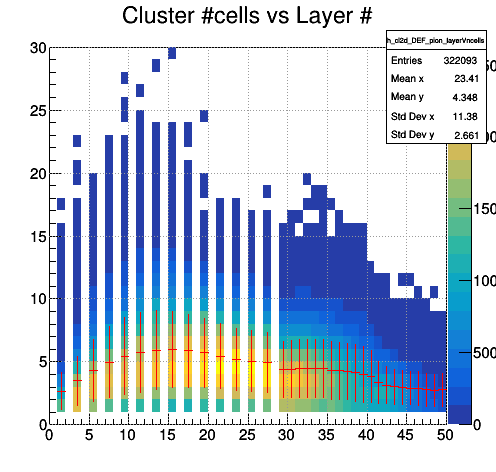

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


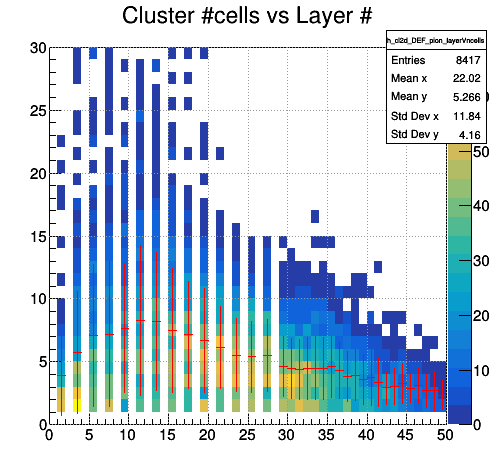

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


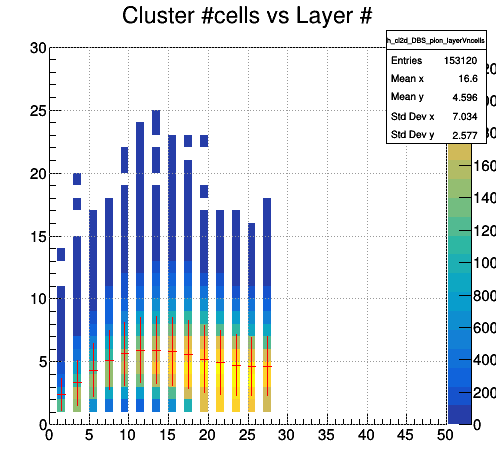

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


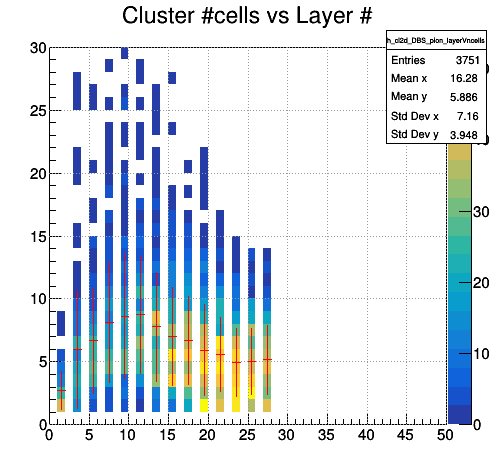

In [58]:
for algo in algos:
    hByAlgo = [histo.h_layerVncells for histo in histosAlgos_all.loc[algo].hcl2d]
    #normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'],'COLZ', do_profile=True)


<ROOT.TProfile object ("aa077e") at 0x7fe06b916400>
<ROOT.TProfile object ("139ec4") at 0x7fe069e38400>
<ROOT.TProfile object ("7eccef") at 0x7fe066d95c00>
<ROOT.TProfile object ("2d0418") at 0x7fe066e0ea00>


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


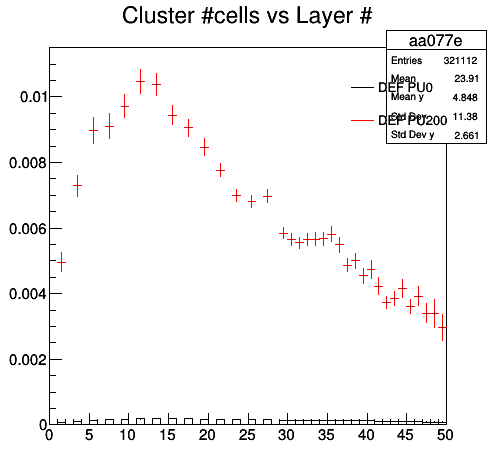

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


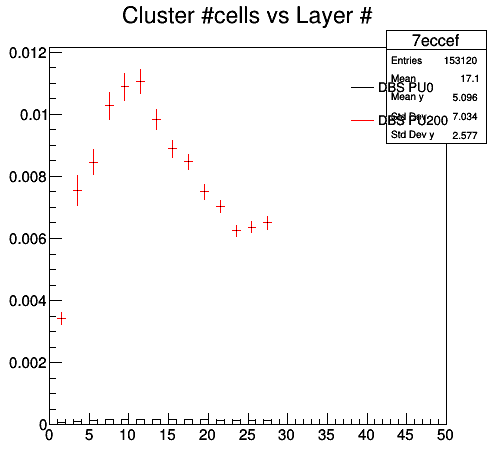

In [59]:
for algo in algos:
    hByAlgo = [histo.h_layerVncells.ProfileX(uuid.uuid4().hex[:6]) for histo in histosAlgos_all.loc[algo].hcl2d]
    normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'])


### 2D Cluster Energy


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


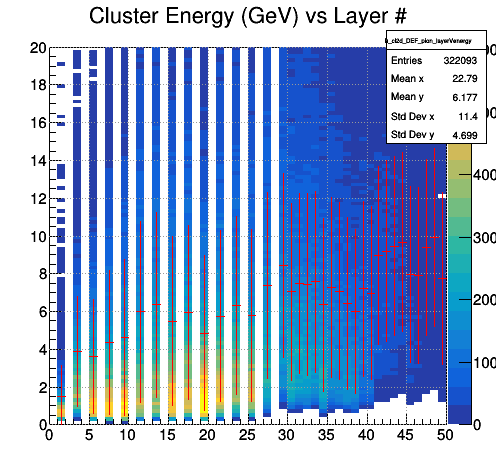

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


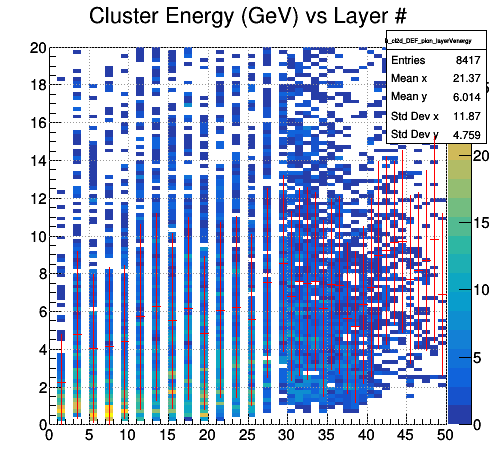

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


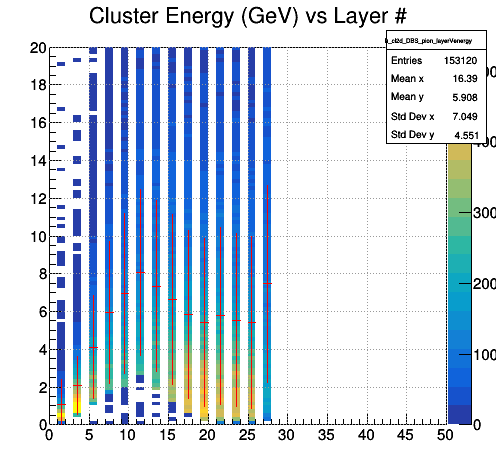

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


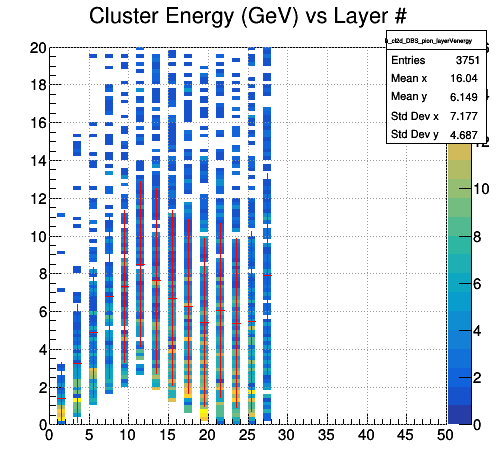

In [60]:
for algo in algos:
    hByAlgo = [histo.h_layerVenergy for histo in histosAlgos_all.loc[algo].hcl2d]
    #normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'],'COLZ', do_profile=True)


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


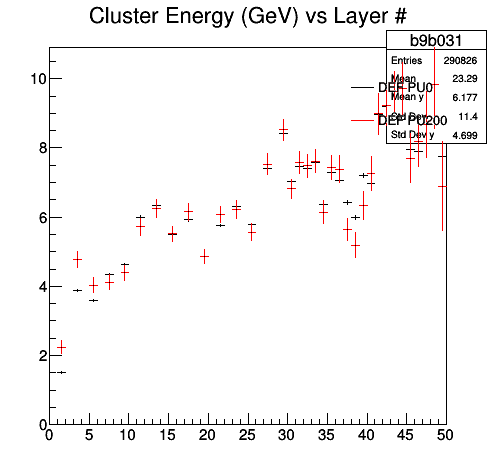

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


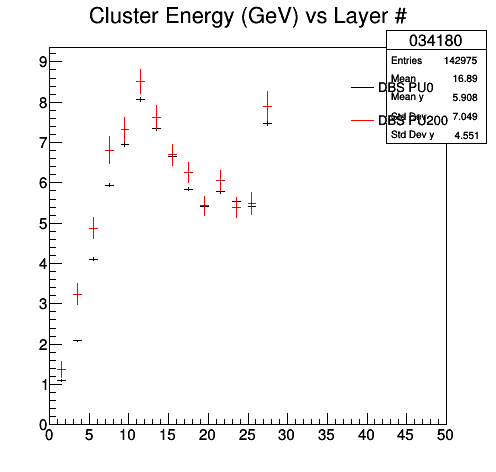

In [61]:
for algo in algos:
    hByAlgo = [histo.h_layerVenergy.ProfileX(uuid.uuid4().hex[:6]) for histo in histosAlgos_all.loc[algo].hcl2d]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'])


We compare DBS and NN cluters for PU 200

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


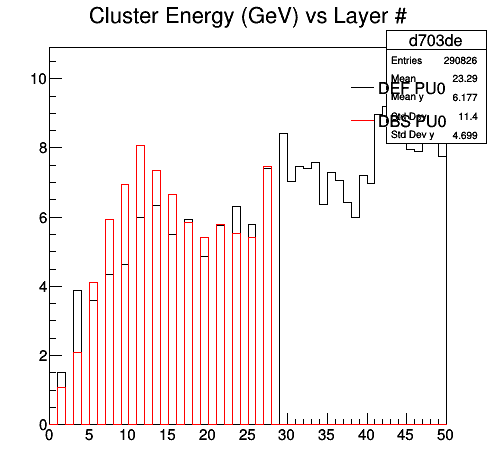

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


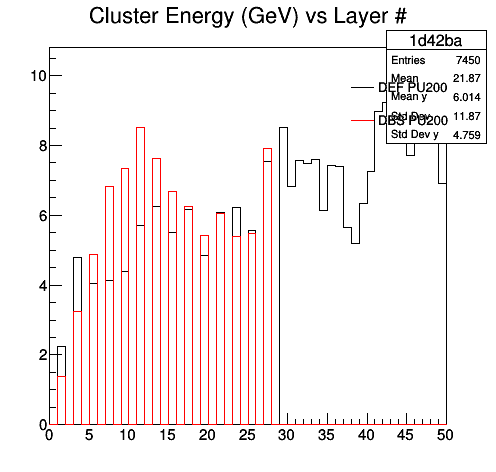

In [62]:
for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample = [histo.h_layerVenergy.ProfileX(uuid.uuid4().hex[:6]) for histo in  histosAlgos_all['hcl2d'].apply(lambda x: x[s_id])]
    drawSame(hBySample, labels_bySample,'hist')

### 3D clusters: # of 2D components


In [63]:
for algo in algos:
    hByAlgo = [histo.h_nclu for histo in histosAlgos_all.loc[algo].hcl3d]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)


In [64]:
for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample = [histo.h_nclu for histo in  histosAlgos_all['hcl3d'].apply(lambda x: x[s_id])]
    drawSame(hBySample, labels_bySample,'hist',logy=True)

### 3D cluster energy


In [65]:
for algo in algos:
    hByAlgo = [histo.h_energy for histo in histosAlgos_all.loc[algo].hcl3d]
    normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)




<ROOT.TH1F object ("h_cl3d_DEF_pion_energy") at 0x7fe06b415b90>
<ROOT.TH1F object ("h_cl3d_DEF_pion_energy") at 0x7fe06b417890>
<ROOT.TH1F object ("h_cl3d_DBS_pion_energy") at 0x7fe06b235930>
<ROOT.TH1F object ("h_cl3d_DBS_pion_energy") at 0x7fe06a3df3e0>


In [66]:
for algo in algos:
    hByAlgo = [histo.h_pt for histo in histosAlgos_all.loc[algo].hcl3d]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)


### Matched TCs


In [67]:


for algo in algos:
    hByAlgo = [histo.h_energy for histo in histosAlgos_all.loc[algo].htc]
    normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)


<ROOT.TH1F object ("h_tc_DEF_pion_energy") at 0x7fe06b1a2fa0>
<ROOT.TH1F object ("h_tc_DEF_pion_energy") at 0x7fe06b1aa3a0>
<ROOT.TH1F object ("h_tc_DBS_pion_energy") at 0x7fe06b3018c0>
<ROOT.TH1F object ("h_tc_DBS_pion_energy") at 0x7fe06b1b1e10>


<ROOT.TProfile object ("h_tc_DEF_pion_layer") at 0x7fe069dd0a00>
<ROOT.TProfile object ("h_tc_DEF_pion_layer") at 0x7fe0694bbc00>
<ROOT.TProfile object ("h_tc_DBS_pion_layer") at 0x7fe0693ce400>
<ROOT.TProfile object ("h_tc_DBS_pion_layer") at 0x7fe066e07400>


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


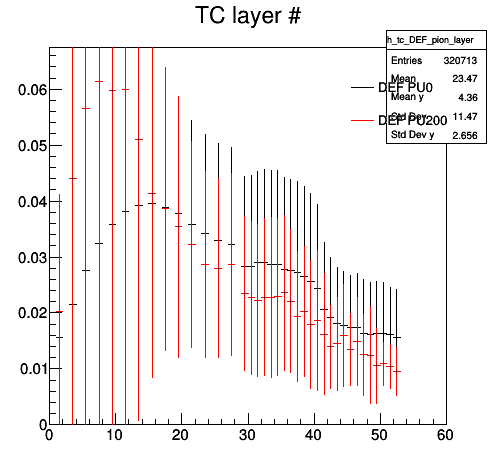

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


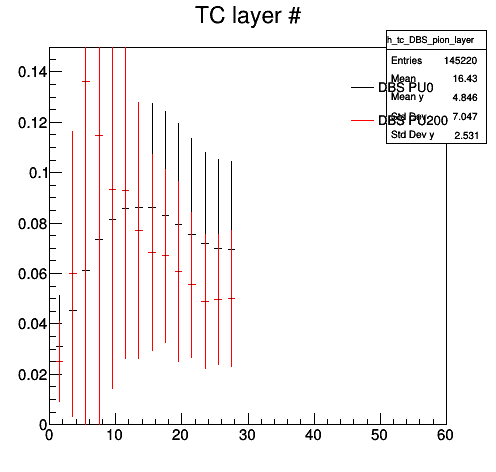

In [68]:
for algo in algos:
    hByAlgo = [histo.h_layer for histo in histosAlgos_all.loc[algo].htc]
    normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


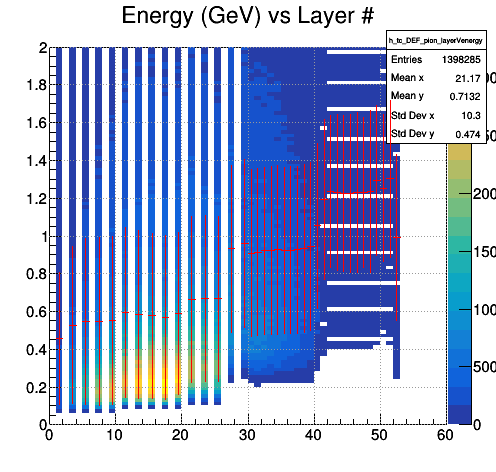

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


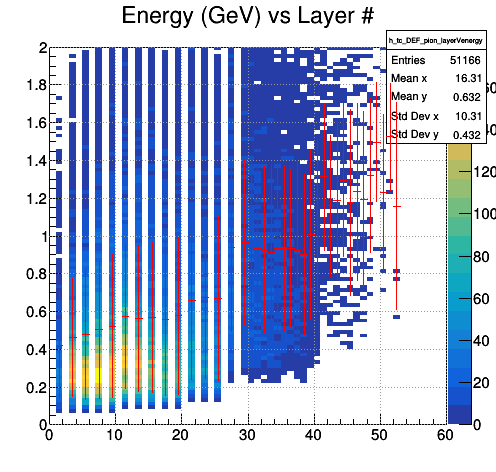

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


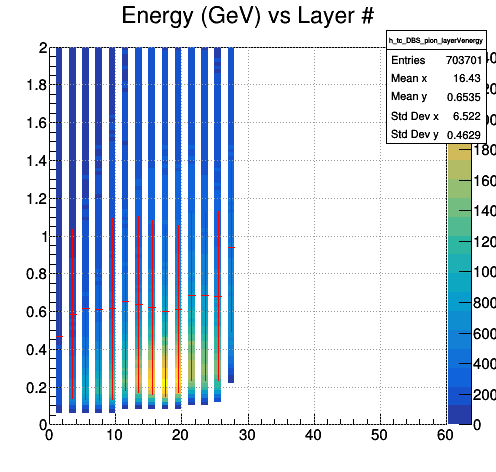

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


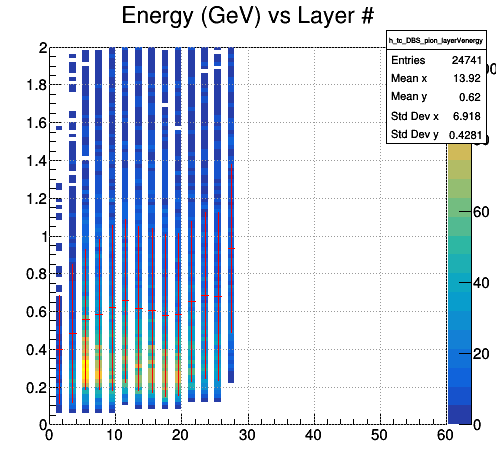

In [69]:
for algo in algos:
    hByAlgo = [histo.h_layerVenergy for histo in histosAlgos_all.loc[algo].htc]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'COLZ',do_profile=True)
    #print hByAlgo[0].GetName()

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


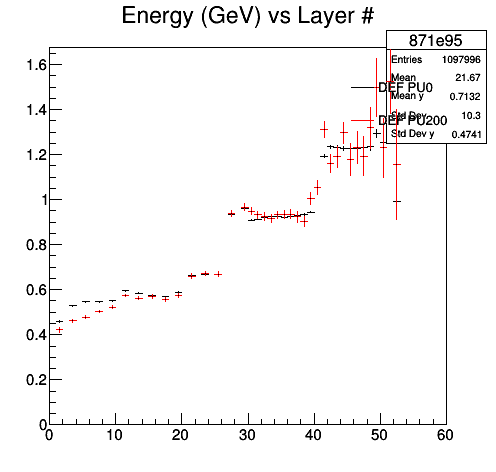

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


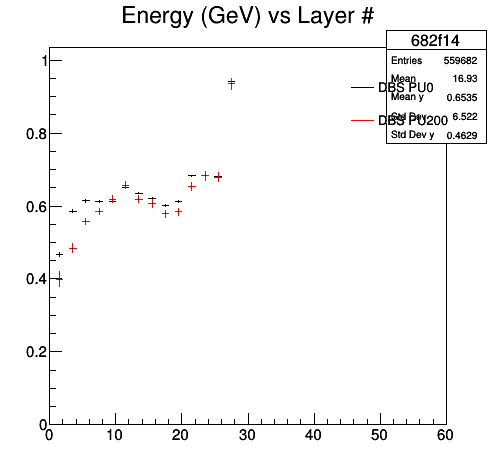

In [70]:
for algo in algos:
    hByAlgo = [histo.h_layerVenergy.ProfileX(uuid.uuid4().hex[:6]) for histo in histosAlgos_all.loc[algo].htc]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'])


The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


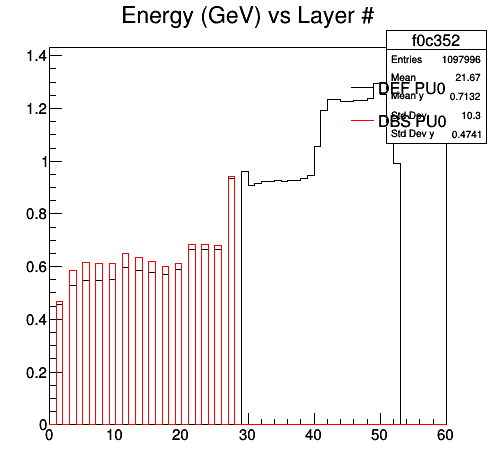

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


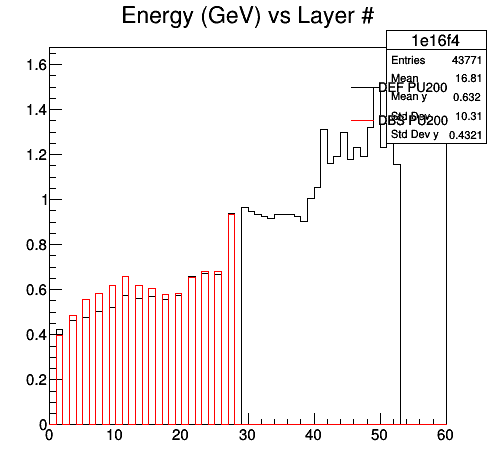

In [71]:
for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample = [histo.h_layerVenergy.ProfileX(uuid.uuid4().hex[:6]) for histo in  histosAlgos_all['htc'].apply(lambda x: x[s_id])]
    drawSame(hBySample, labels_bySample,'hist')

## Resolution Studies
### 3D cluster: Pt resolution

In [72]:
histosAlgos_all = HistoSetRetriever(histos.HistoSetReso, algos, particle, samples, normalization=nevents_ee).histos
histosAlgos_all

['h_reso_DEF_pion_centralEnergyRes', 'h_reso_DEF_pion_coreEnergyRes', 'h_reso_DEF_pion_coreEnergyResVnclu', 'h_reso_DEF_pion_corePtRes', 'h_reso_DEF_pion_corePtResVnclu', 'h_reso_DEF_pion_drRes', 'h_reso_DEF_pion_energyRes', 'h_reso_DEF_pion_energyResVeta', 'h_reso_DEF_pion_energyResVnclu', 'h_reso_DEF_pion_etaRes', 'h_reso_DEF_pion_phiRes', 'h_reso_DEF_pion_ptRes', 'h_reso_DEF_pion_ptResVeta', 'h_reso_DEF_pion_ptResVnclu', 'h_reso_DEF_pion_ptResVpt']
['h_resoCone_DEF_pion_centralEnergyRes', 'h_resoCone_DEF_pion_coreEnergyRes', 'h_resoCone_DEF_pion_coreEnergyResVnclu', 'h_resoCone_DEF_pion_corePtRes', 'h_resoCone_DEF_pion_corePtResVnclu', 'h_resoCone_DEF_pion_drRes', 'h_resoCone_DEF_pion_energyRes', 'h_resoCone_DEF_pion_energyResVeta', 'h_resoCone_DEF_pion_energyResVnclu', 'h_resoCone_DEF_pion_etaRes', 'h_resoCone_DEF_pion_phiRes', 'h_resoCone_DEF_pion_ptRes', 'h_resoCone_DEF_pion_ptResVeta', 'h_resoCone_DEF_pion_ptResVnclu', 'h_resoCone_DEF_pion_ptResVpt']
['h_reso2D_DEF_pion_DRRes', 

,hreso,hreso2D,hresoCone,labels,norm
DEF,[<l1THistos.ResoHistos instance at 0x1094f13f8...,[<l1THistos.Reso2DHistos instance at 0x1094f1a...,[<l1THistos.ResoHistos instance at 0x1094f1d88...,"[DEF PU0, DEF PU200]","[32584.0, 791.0]"
DBS,[<l1THistos.ResoHistos instance at 0x1094f1d40...,[<l1THistos.Reso2DHistos instance at 0x10e5323...,[<l1THistos.ResoHistos instance at 0x1094e6710...,"[DBS PU0, DBS PU200]","[32584.0, 791.0]"


#### Matching to the highes pT cluster in DR 0.2 from GEN

In [73]:

for algo in algos:
    hByAlgo = [histo.h_ptRes for histo in histosAlgos_all.loc[algo].hreso]
#     normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)




In [74]:
for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample = [histo.h_ptRes for histo in  histosAlgos_all['hreso'].apply(lambda x: x[s_id])]
    drawSame(hBySample, labels_bySample,'hist')

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


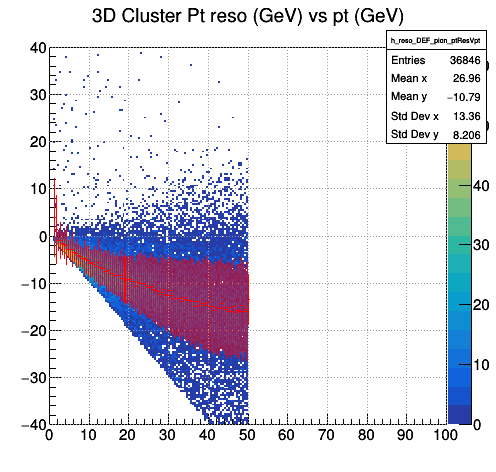

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


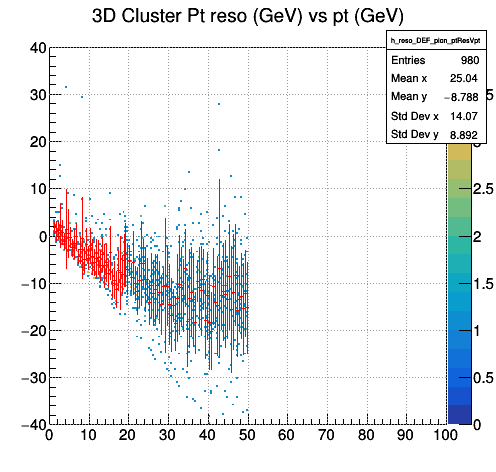

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


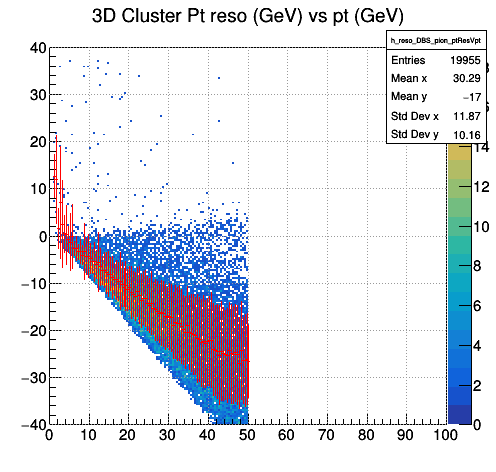

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


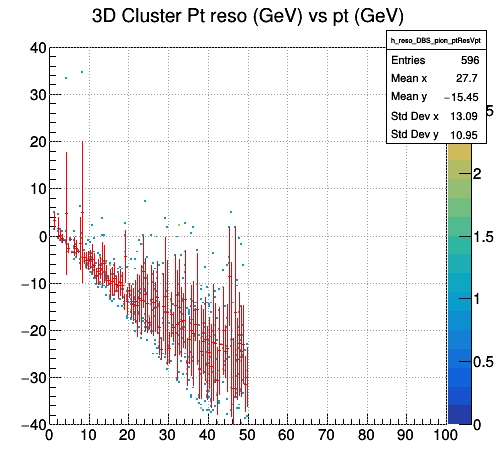

In [75]:
for algo in algos:
    hByAlgo = [histo.h_ptResVpt for histo in histosAlgos_all.loc[algo].hreso]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'COLZ',do_profile=True)
    #print hByAlgo[0].GetName()

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


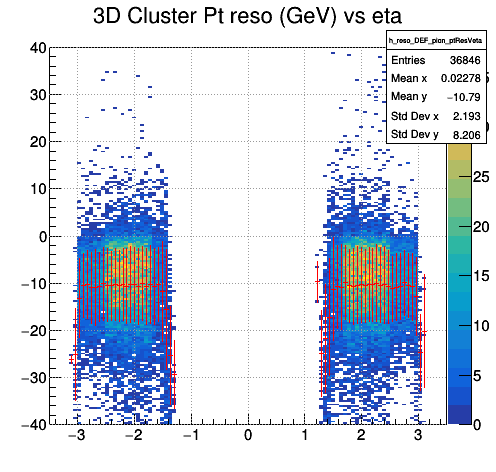

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


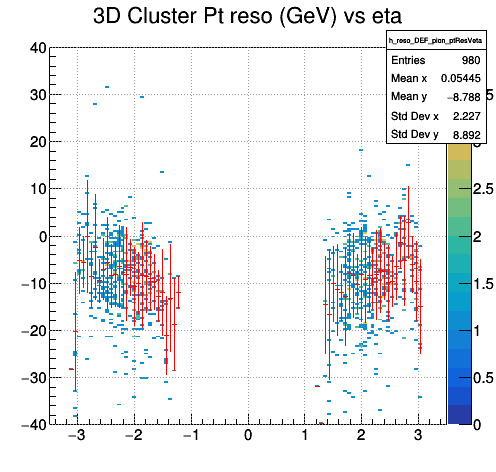

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


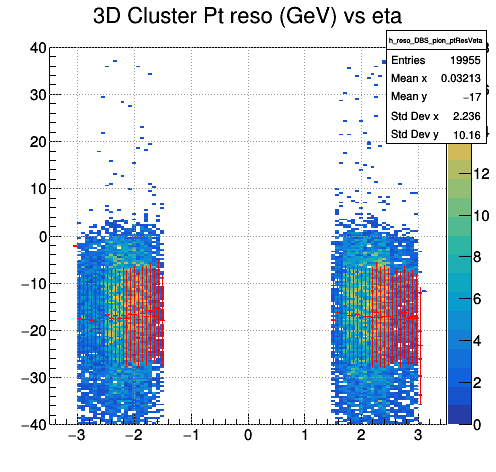

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


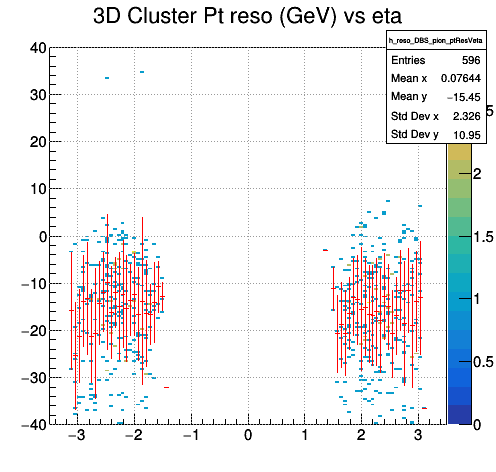

In [76]:
for algo in algos:
    hByAlgo = [histo.h_ptResVeta for histo in histosAlgos_all.loc[algo].hreso]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'COLZ',do_profile=True)

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


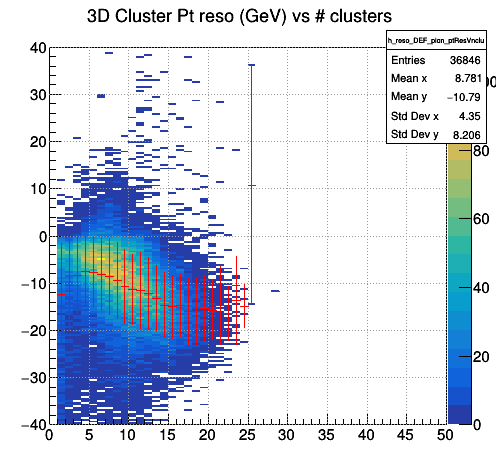

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


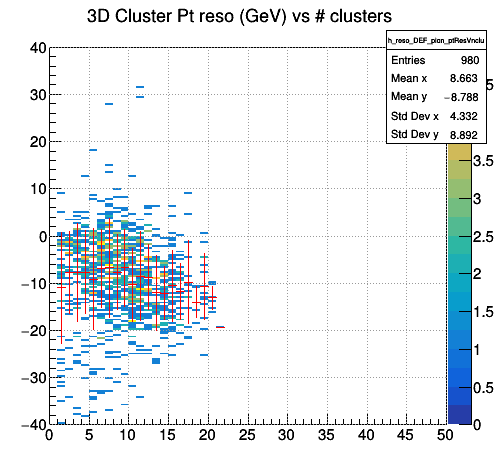

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


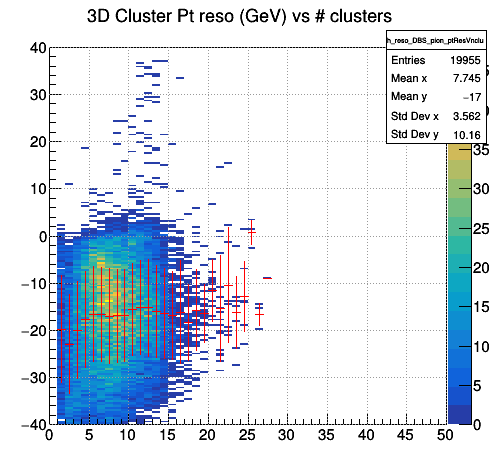

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


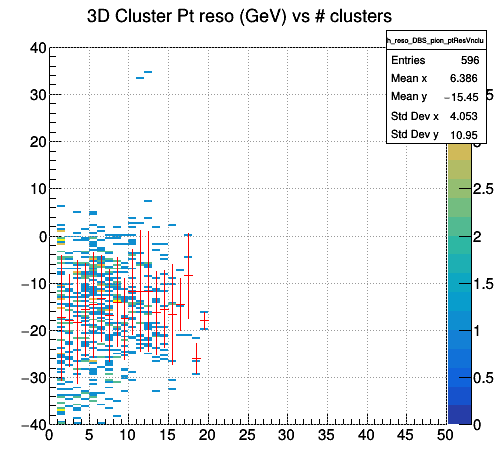

In [77]:
for algo in algos:
    hByAlgo = [histo.h_ptResVnclu for histo in histosAlgos_all.loc[algo].hreso]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'COLZ',do_profile=True)

In [78]:
for algo in algos:
    hByAlgo = [histo.h_phiRes for histo in histosAlgos_all.loc[algo].hreso]
#     normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)



In [79]:
for algo in algos:
    hByAlgo = [histo.h_etaRes for histo in histosAlgos_all.loc[algo].hreso]
#     normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)


In [80]:
for algo in algos:
    hByAlgo = [histo.h_drRes for histo in histosAlgos_all.loc[algo].hreso]
#     normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)


#### All clusters in DR 0.2 from GEN

In [81]:
for algo in algos:
    hByAlgo = [histo.h_ptRes for histo in histosAlgos_all.loc[algo].hresoCone]
#     normalize(hByAlgo, histosAlgos_all.loc[algo]['norm'])
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)


We now compare the 2 defitnitions (highest pt and all clusters in cone) for the same PU point

In [82]:
algo = 'DEF'
hByAlgo_best = [histo.h_ptRes for histo in histosAlgos_all.loc[algo].hreso]
hByAlgo_cone = [histo.h_ptRes for histo in histosAlgos_all.loc[algo].hresoCone]

drawSame([hByAlgo_best[0], hByAlgo_cone[0]], ['DEF PU0 best', 'DEF PU0 cone'])
drawSame([hByAlgo_best[1].Rebin(2), hByAlgo_cone[1].Rebin(2)], ['DEF PU200 best', 'DEF PU200 cone'])


We now show the behavior of the pt residuals vs pt of the GEN particle

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


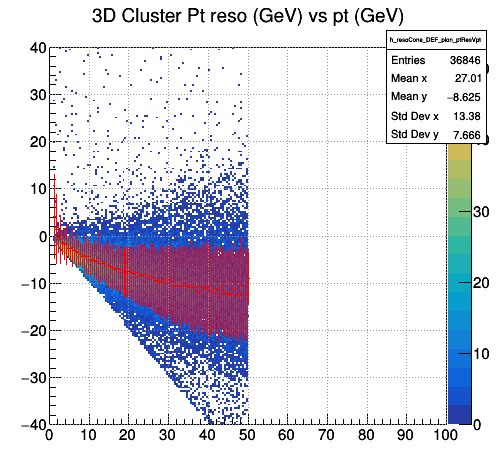

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


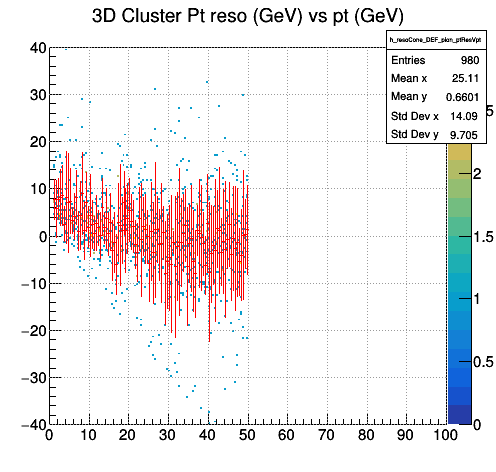

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


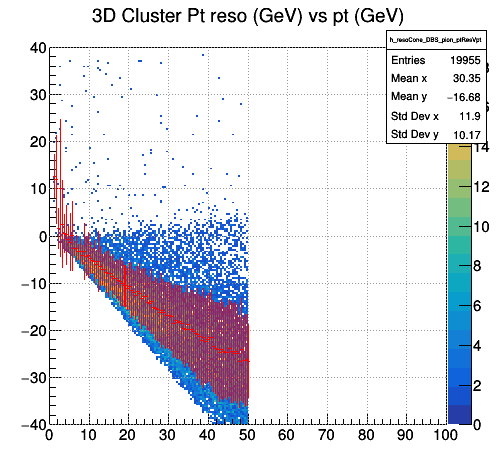

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


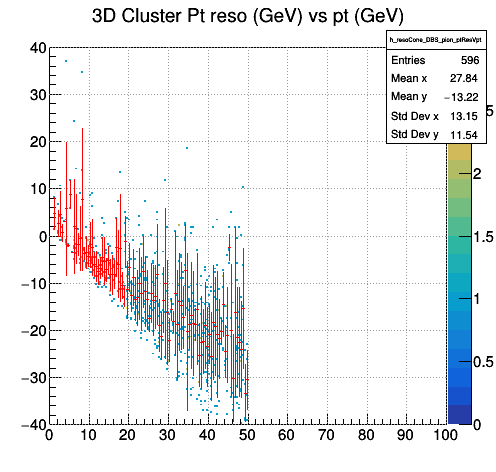

In [83]:
for algo in algos:
    hByAlgo = [histo.h_ptResVpt for histo in histosAlgos_all.loc[algo].hresoCone]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'COLZ',do_profile=True)
    #print hByAlgo[0].GetName()

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


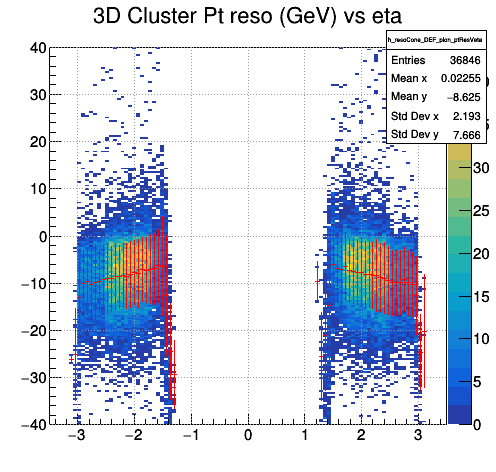

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


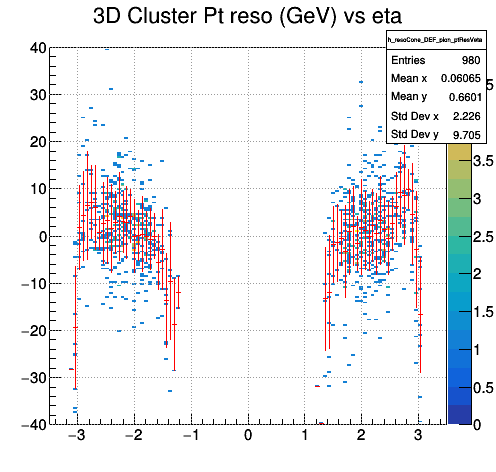

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


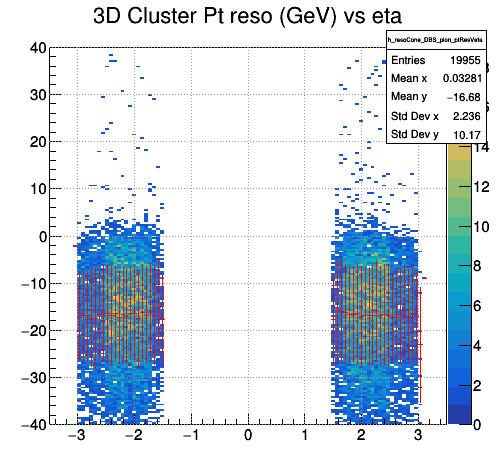

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


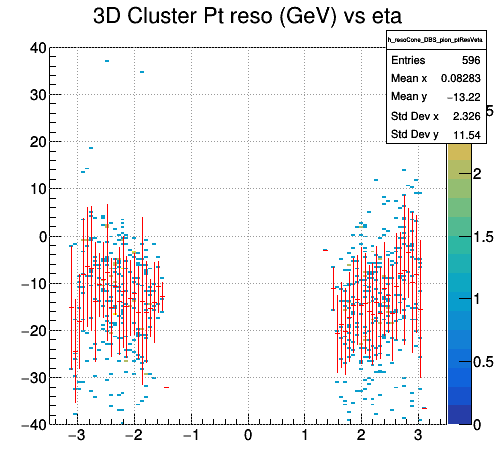

In [84]:
for algo in algos:
    hByAlgo = [histo.h_ptResVeta for histo in histosAlgos_all.loc[algo].hresoCone]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'COLZ',do_profile=True)

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


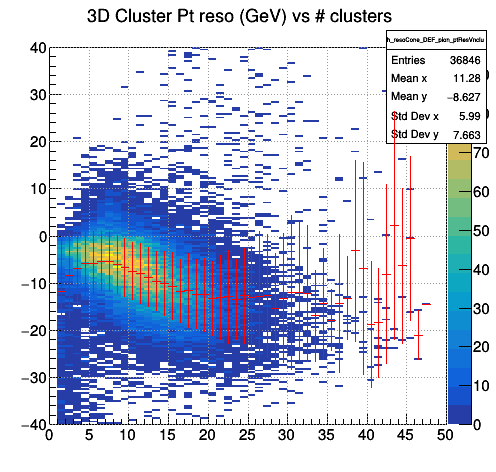

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


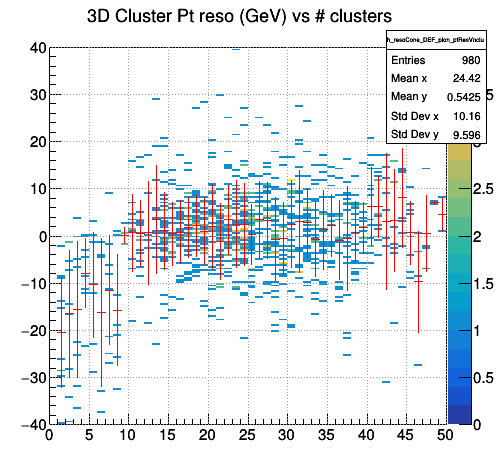

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


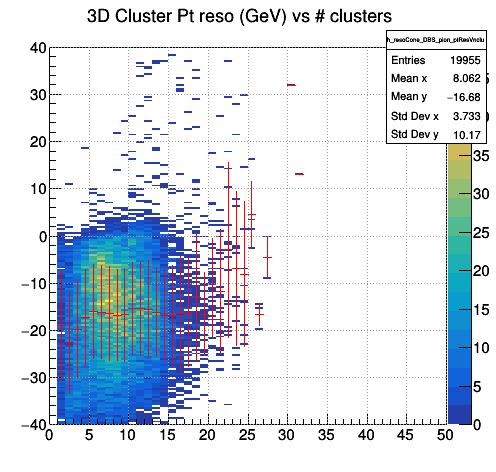

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


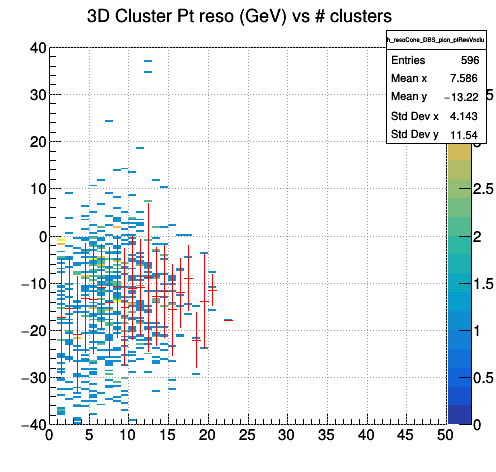

In [85]:
for algo in algos:
    hByAlgo = [histo.h_ptResVnclu for histo in histosAlgos_all.loc[algo].hresoCone]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'COLZ',do_profile=True)

### Energy resolution


In [86]:


for algo in algos:
    hByAlgo = [histo.h_energyRes for histo in histosAlgos_all.loc[algo].hreso]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSame(hByAlgo, histosAlgos_all.loc[algo]['labels'], norm=True)



In [87]:

for s_id in range(0, len(samples)):
    labels_bySample = histosAlgos_all['labels'].apply(lambda x: x[s_id])
    hBySample = [histo.h_energyRes for histo in  histosAlgos_all['hreso'].apply(lambda x: x[s_id])]
    drawSame(hBySample, labels_bySample,'hist',logy=True)


## Postion resolution of 2D clusters

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


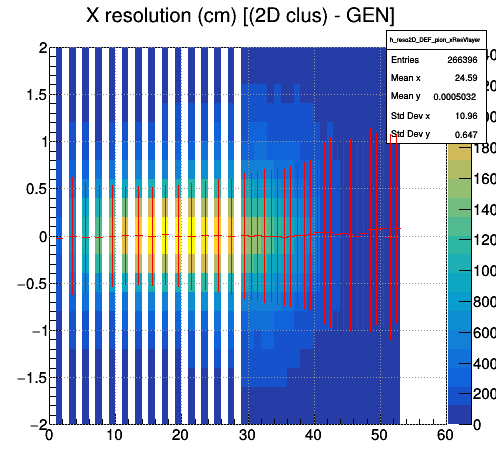

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


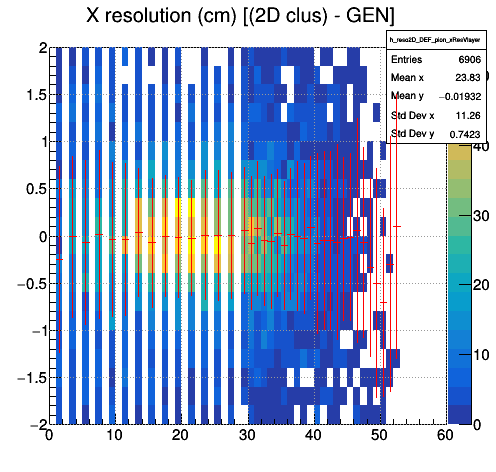

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


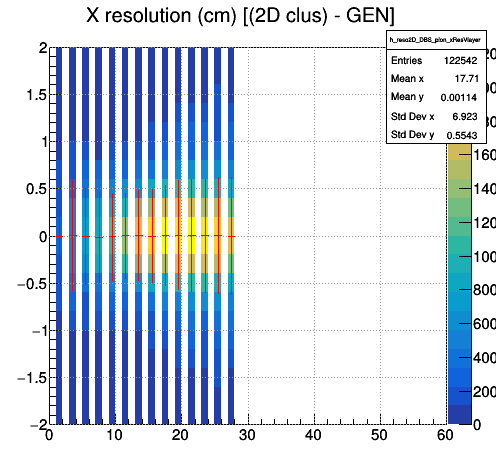

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


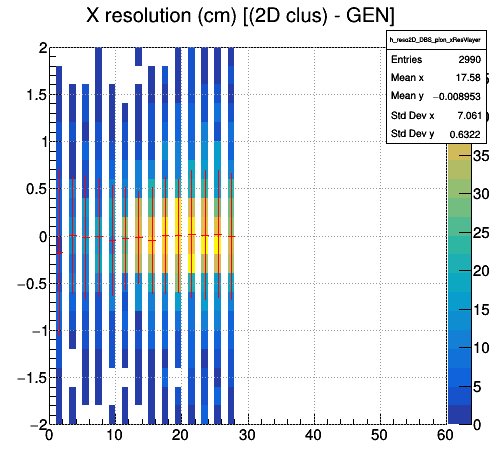

In [88]:
for algo in algos:
    hByAlgo = [histo.h_xResVlayer for histo in histosAlgos_all.loc[algo].hreso2D]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'COLZ',do_profile=True, miny=-2, maxy=2)

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


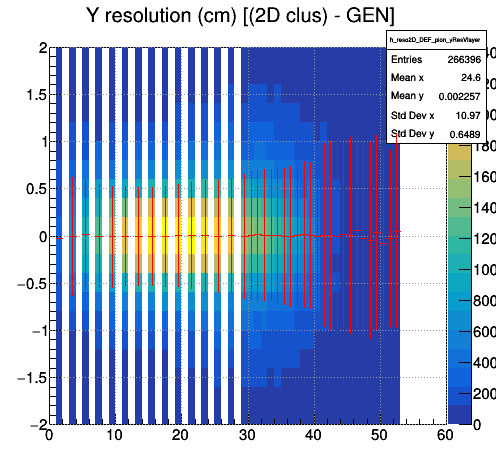

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


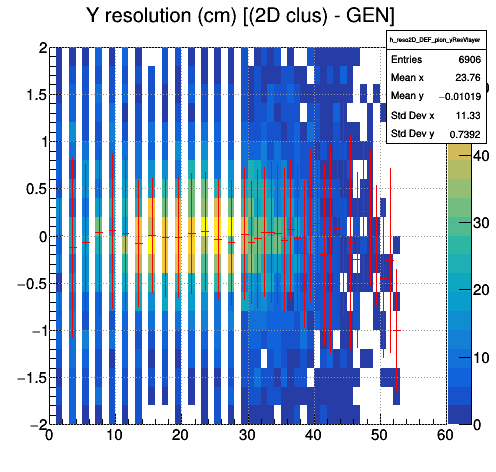

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


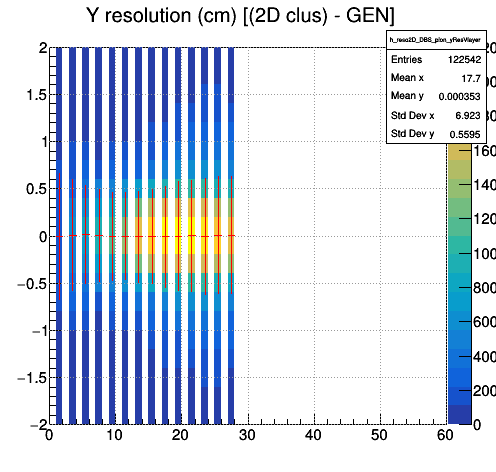

The canvas contains an object of a type jsROOT cannot currently handle (TProfile). Falling back to a static png.


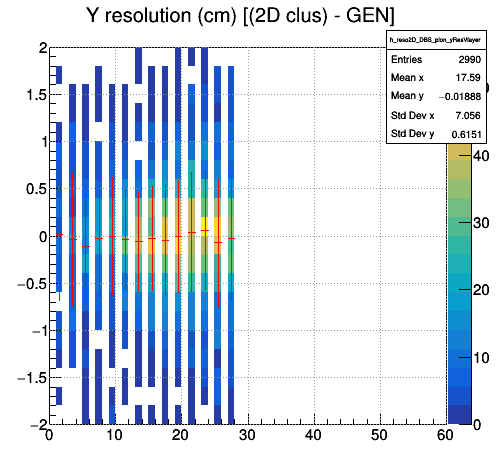

In [89]:
for algo in algos:
    hByAlgo = [histo.h_yResVlayer for histo in histosAlgos_all.loc[algo].hreso2D]
    #normalize(hclAll_pt35_layer, nevents_pt35)
    drawSeveral(hByAlgo, histosAlgos_all.loc[algo]['labels'], 'COLZ',do_profile=True, miny=-2, maxy=2)

## Resolution using layers 10 to 20 only

In [90]:
helereso_centralEnergyRes = [hist.h_centralEnergyRes for hist in helereso_histos]
drawSame(helereso_centralEnergyRes, elePu_labels, options='hist')

NameError: name 'helereso_histos' is not defined

In [ ]:
heleresoDBS_centralEnergyRes = [hist.h_centralEnergyRes for hist in heleresoDBS_histos]
drawSame(heleresoDBS_centralEnergyRes, elePu_labels,options='hist')

In [ ]:
drawSame([helereso_centralEnergyRes[3], heleresoDBS_centralEnergyRes[3]], ['NN PU200', 'DBS PU200'])

In [ ]:
heleresoDBS_coreEnergyRes = [hist.h_coreEnergyRes for hist in heleresoDBS_histos]
drawSame(heleresoDBS_coreEnergyRes, elePu_labels,options='hist')

In [ ]:

helereso_energyRes_scaled = [hist.Clone() for hist in helereso_energyRes]
heleresoGEO_energyRes_scaled = [hist.Clone() for hist in heleresoGEO_energyRes]

heleresoDBS_energyRes_scaled = [hist.Clone() for hist in heleresoDBS_energyRes]
heleresoDBS_coreEnergyRes_scaled = [hist.Clone() for hist in heleresoDBS_coreEnergyRes]


In [ ]:
# we compare resolutions @ PU 0
puIdx = 0
drawSame([helereso_energyRes[puIdx], heleresoGEO_energyRes[puIdx], heleresoDBS_energyRes[puIdx]], ['PU0 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=False)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[puIdx]], ['PU0 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_coreEnergyRes_scaled[puIdx]], ['PU0 NN clusters', 'PU0 GEO', 'PU0 DBSCAN CORE clusters'], options='hist', norm=True)


In [ ]:
# we compare resolutions @ PU 50
puIdx = 1
drawSame([helereso_energyRes[puIdx], heleresoGEO_energyRes[puIdx], heleresoDBS_energyRes[puIdx]], ['PU50 NN clusters', 'PU50 GEO', 'PU50 DBSCAN clusters'], options='hist', norm=False)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[puIdx]], ['PU50 NN clusters', 'PU50 GEO', 'PU50 DBSCAN clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_coreEnergyRes_scaled[puIdx]], ['PU50 NN clusters', 'PU50 GEO', 'PU50 DBSCAN CORE clusters'], options='hist', norm=True)


In [ ]:
# we compare resolutions @ PU 100
puIdx = 2
drawSame([helereso_energyRes[puIdx], heleresoGEO_energyRes[puIdx], heleresoDBS_energyRes[puIdx]], ['PU100 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=False)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[puIdx]], ['PU100 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_coreEnergyRes_scaled[puIdx]], ['PU100 NN clusters', 'PU0 GEO', 'PU0 DBSCAN CORE clusters'], options='hist', norm=True)


In [ ]:
# we compare resolutions @ PU 200
puIdx = 3
drawSame([helereso_energyRes[puIdx], heleresoGEO_energyRes[puIdx], heleresoDBS_energyRes[puIdx]], ['PU200 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=False)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[puIdx]], ['PU200 NN clusters', 'PU0 GEO', 'PU0 DBSCAN clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[puIdx], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_coreEnergyRes_scaled[puIdx]], ['PU200 NN clusters', 'PU0 GEO', 'PU0 DBSCAN CORE clusters'], options='hist', norm=True)
drawSame([helereso_energyRes_scaled[3], heleresoGEO_energyRes_scaled[puIdx], heleresoDBS_energyRes_scaled[3], heleresoDBS_coreEnergyRes_scaled[3]], ['PU200 NN', 'PU200 GEO', 'PU200 DBSCAN', 'PU200 DBSCAN Core'], options='hist', norm=False)



In [ ]:
helereso_energyResVnclu = [hist.h_energyResVnclu for hist in helereso_histos]
drawSeveral(helereso_energyResVnclu, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
helereso_energyResVnclu_1 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 19, 26).Rebin(2) for hist in helereso_histos]
drawSame(helereso_energyResVnclu_1, elePu_labels, options='hist')



In [ ]:
helereso_energyResVnclu_2 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 1, 18).Rebin(2) for hist in helereso_histos]
drawSame(helereso_energyResVnclu_2, elePu_labels, options='hist')


In [ ]:
heleresoGEO_energyResVnclu = [hist.h_energyResVnclu for hist in heleresoGEO_histos]
drawSeveral(heleresoGEO_energyResVnclu, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoGEO_energyResVnclu_1 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 19, 26).Rebin(2) for hist in heleresoGEO_histos]
drawSame(heleresoGEO_energyResVnclu_1, elePu_labels, options='hist')


In [ ]:
heleresoGEO_energyResVnclu_2 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 1, 18).Rebin(2) for hist in heleresoGEO_histos]
drawSame(heleresoGEO_energyResVnclu_2, elePu_labels, options='hist')


In [ ]:
heleresoDBS_energyResVnclu = [hist.h_energyResVnclu for hist in heleresoDBS_histos]
drawSeveral(heleresoDBS_energyResVnclu, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoDBS_energyResVnclu_1 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 19, 26).Rebin(2) for hist in heleresoDBS_histos]
drawSame(heleresoDBS_energyResVnclu_1, elePu_labels, options='hist')


In [ ]:
heleresoDBS_energyResVnclu_2 = [hist.h_energyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 1, 18).Rebin(2) for hist in heleresoDBS_histos]
drawSame(heleresoDBS_energyResVnclu_2, elePu_labels, options='hist')


In [ ]:
heleresoDBS_coreEnergyResVnclu = [hist.h_coreEnergyResVnclu for hist in heleresoDBS_histos]
drawSeveral(heleresoDBS_coreEnergyResVnclu, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoDBS_coreEnergyResVnclu_1 = [hist.h_coreEnergyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 19, 26).Rebin(2) for hist in heleresoDBS_histos]
drawSame(heleresoDBS_coreEnergyResVnclu_1, elePu_labels, options='hist')


In [ ]:
heleresoDBS_coreEnergyResVnclu_2 = [hist.h_coreEnergyResVnclu.ProjectionY(uuid.uuid4().hex[:6], 1, 18).Rebin(2) for hist in heleresoDBS_histos]
drawSame(heleresoDBS_coreEnergyResVnclu_2, elePu_labels, options='hist')


In [ ]:
drawSame([helereso_energyResVnclu_1[3], heleresoGEO_energyResVnclu_1[3], heleresoDBS_energyResVnclu_1[3], heleresoDBS_coreEnergyResVnclu_1[3]], ['NN PU200', 'GEO PU 200', 'DBS PU 200', 'DBS Core PU200'], options='hist',norm=True)

In [ ]:
drawSame([helereso_energyResVnclu_2[3], heleresoDBS_energyResVnclu_2[3], heleresoDBS_coreEnergyResVnclu_2[3]], ['NN PU200', 'DBS PU 200', 'DBS Core PU200'], options='hist',norm=True)

In [ ]:
helereso_energyResVeta = [hist.h_energyResVeta for hist in helereso_histos]
drawSeveral(helereso_energyResVeta, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoGEO_energyResVeta = [hist.h_energyResVeta for hist in heleresoGEO_histos]
drawSeveral(heleresoGEO_energyResVeta, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
heleresoDBS_energyResVeta = [hist.h_energyResVeta for hist in heleresoDBS_histos]
drawSeveral(heleresoDBS_energyResVeta, elePu_labels, 'COLZ',do_profile=True)


In [ ]:
helereso_energyResCentral = [hist.h_energyResVeta.ProjectionY(uuid.uuid4().hex[:6], 15, 86) for hist in helereso_histos]
heleresoDBS_energyResCentral = [hist.h_energyResVeta.ProjectionY(uuid.uuid4().hex[:6], 15, 86) for hist in heleresoDBS_histos]

In [ ]:
drawSame(helereso_energyResCentral, elePu_labels,options='hist')

In [ ]:
drawSame(heleresoDBS_energyResCentral, elePu_labels,options='hist')

In [ ]:
drawSame([helereso_energyResCentral[0], heleresoDBS_energyResCentral[0]], ['PU0 NN clusters', 'PU0 DBSCAN clusters'], options='hist', norm=False)


In [ ]:
drawSame([helereso_energyResCentral[3], heleresoDBS_energyResCentral[3]], ['PU200 NN clusters', 'PU200 DBSCAN clusters'], options='hist', norm=False)


In [ ]:
helereso_profEnergyResVeta = [hist.ProfileX(uuid.uuid4().hex[:6]) for hist in helereso_energyResVeta]
heleresoDBS_profEnergyResVeta = [hist.ProfileX(uuid.uuid4().hex[:6]) for hist in heleresoDBS_energyResVeta]


In [ ]:
drawSame([helereso_profEnergyResVeta[0], heleresoDBS_profEnergyResVeta[0]],['NN PU0', 'DBS PU0'])

In [ ]:
drawSame([helereso_profEnergyResVeta[1], heleresoDBS_profEnergyResVeta[1]],['NN PU50', 'DBS PU50'])

In [ ]:
drawSame([helereso_profEnergyResVeta[2], heleresoDBS_profEnergyResVeta[2]],['NN PU100', 'DBS PU100'])

In [ ]:
drawSame([helereso_profEnergyResVeta[3], heleresoDBS_profEnergyResVeta[3]],['NN PU200', 'DBS PU200'])

In [ ]:
hreso2D_etaRes = [hist.h_etaRes for hist in hreso2D_histos]
drawSame(hreso2D_etaRes, elePu_labels,options='hist', logy=True)

In [ ]:
hreso2DDBS_etaRes = [hist.h_etaRes for hist in hreso2DDBS_histos]
drawSame(hreso2DDBS_etaRes, elePu_labels,options='hist', logy=True)

In [ ]:
hreso2D_phiMRes = [hist.h_phiMRes for hist in hreso2D_histos]
drawSame(hreso2D_phiMRes, elePu_labels,options='hist', logy=True)

In [ ]:
hreso2DDBS_phiMRes = [hist.h_phiMRes for hist in hreso2DDBS_histos]
drawSame(hreso2DDBS_phiMRes, elePu_labels,options='hist', logy=True)

In [ ]:
drawSame([hreso2D_phiMRes[3], hreso2DDBS_phiMRes[3]],['PU200 NN', 'PU200 DBS'], logy=True)